In [2]:
#Loading data and preprocessing

In [3]:
## Import relevant libaries
import os
from glob import glob
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import numpy as np
np.random.seed(1337)
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Flatten
from keras.layers import Dense
from keras.preprocessing.image import ImageDataGenerator

/home/ubuntu/anaconda3/lib/python3.6/site-packages/matplotlib/__init__.py:1067: UserWarning: Duplicate key in file "/home/ubuntu/.config/matplotlib/matplotlibrc", line #2
  (fname, cnt))
/home/ubuntu/anaconda3/lib/python3.6/site-packages/matplotlib/__init__.py:1067: UserWarning: Duplicate key in file "/home/ubuntu/.config/matplotlib/matplotlibrc", line #3
  (fname, cnt))
/home/ubuntu/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [4]:
## Setting up dataset directories and file paths
path = "/home/ubuntu/trainsets"
center = os.path.join(path, "center", "*.jpg")
interpolated = os.path.join(path, "interpolated.csv")
steering = os.path.join(path, "steering.csv")

In [5]:
## Setting up a dataset with filename(in order of time-stamps) and steering angles
labels = pd.read_csv(interpolated)
cent = labels['filename'].apply(lambda x: "center" in x)
y = labels[cent][['angle']]
X = labels[cent]['filename']
y.describe()

,angle
count,33808.000000
mean,-0.008479
std,0.271529
min,-2.050762
25%,-0.080285
50%,-0.004179
75%,0.048127
max,1.903262


In [6]:
X_train=X
y_train=y

In [7]:
## Setting up testing dataset directories and file paths
test_path = "/home/ubuntu/testing"
test_center = os.path.join(test_path, "center", "*.jpg")
test_interpolated = os.path.join(test_path, "interpolated.csv")
test_steering = os.path.join(test_path, "steering.csv")

In [8]:
## Setting up a dataset with filename(in order of time-stamps) and steering angles
test_labels = pd.read_csv(test_interpolated)
test_cent = test_labels['filename'].apply(lambda x: "center" in x)
y_test = test_labels[test_cent][['angle']]
X_test = test_labels[test_cent]['filename']
y_test.describe()

,angle
count,5279.000000
mean,0.006709
std,0.212928
min,-0.877901
25%,-0.052360
50%,0.005236
75%,0.076794
max,0.949958


In [9]:
#Data Preprocessing Functions
## Helper functions to read images, resize and scale images
def read_img(path,name, size=(224, 224)):
    img = os.path.join(path, name)
    #print(img)
    img = cv2.imread(img)
    #plt.imshow(img)
    #plt.grid('off')
    #plt.show()
    img = cv2.resize(img, size)
    return img
    
def show_img(name, size=(224, 224)):
    img = read_img(name, size)
    plt.imshow(img)
    plt.grid('off')
    plt.show()
    
def preprocess(img):
    img = img.astype('float32')
    img /= 255.0
    return img

In [10]:
# Improved mapper function to create an input using preprocessing functions and create an array
def mapper(data,batch_size=250):
    train_list=[]
    for i in range(0,round(len(data)/batch_size)):
        p=i*batch_size
        for j in range(p,p+batch_size):
            j=data.iloc[j]
            a=read_img(j)
            a=preprocess(a)
            train_list.append(a)
        print(i)
    X=np.array(train_list)
    return X

In [11]:
######Only run the next four cells If you don't have the final_mapper_arrays#######

In [12]:
#Preprocessing testing data using mapper function
#mapper_train_array=mapper(X_train,batch_size=250)

In [13]:
#Saving the final array with all the training data
#np.save('final_train_array', mapper_train_array)

In [14]:
# Preprocessing testing data using mapper function
#mapper_test_array=mapper(X_test,batch_size=250)

In [15]:
#Saving the final
#np.save('final_test_array',mapper_test_array)

In [16]:
#Transfer Learning 

In [17]:
from keras.applications import VGG16
from keras.layers import merge,Input
from keras.layers import Dense

In [18]:
#Loading the vgg model and removing the last dense layer 
image_input = Input(shape=(224,224,3))
model = VGG16(input_tensor = image_input)
model.layers.pop() #removing the last dense layer of the vgg model
model.outputs = [model.layers[-1].output]
model.output_layers = [model.layers[-1]] # added this line in addition to zo7 solution
model.layers[-1].outbound_nodes = []
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [19]:
#Loading the saved input arrays to vgg
#final_train_array = np.load('final_train_array.npy')
#final_test_array = np.load('final_test_array.npy')

In [20]:
#Fucnction to feed forward the input arrays into vgg in batches
def vgg_activations(train_array, batch_size = 10):
    vgg_act = np.zeros((len(train_array),4096))
    for i in range(0, round(len(train_array)/batch_size)):
        p = i*batch_size
        x_batch = train_array[p: p+batch_size]
        activations = model.predict(x_batch)
        vgg_act[p:p+batch_size] = activations
        #print(type(activations))
        #vgg_act.append(activations)
        #print(len(vgg_act))
        print(i)
    vgg_act = np.array(vgg_act)
    return vgg_act

In [21]:
#vgg activations on training set
#final_activations_train = vgg_activations(final_train_array, batch_size = 250)

In [22]:
#saving the activations
#np.save('final_vgg_activations_train', final_activations_train)

In [23]:
#vgg activations array on test set
#final_activations_test = vgg_activations(final_test_array, batch_size = 250)

In [24]:
#saving the test activations
#np.save('final_vgg_activations_test', final_activations_test)

In [25]:
import numpy as np
final_activations_train = np.load('final_vgg_activations_train.npy')
final_activations_test = np.load('final_vgg_activations_test.npy')

In [26]:
#Function to create sequences, input to the lSTM
import toolz
from toolz.itertoolz import sliding_window
#function using sliding window
def create_sequences(size, data):
    sequence = list(sliding_window(size, data))
    sequence = np.array(sequence)
    return sequence

In [27]:
#creating the train sequence
train_sequence_5 = create_sequences(5, final_activations_train)

In [28]:
#Creating the test sequence
test_sequence_5 = create_sequences(5, final_activations_test)

In [29]:
#train labels
y_train_5 = np.array(y['angle'][:33746])

In [30]:
#Test labels
y_test_5 = np.array(y_test['angle'][:5246])

In [31]:
#LSTM Model

In [32]:
from keras.preprocessing import sequence
from keras.models import Sequential
from keras.layers import Dense, Embedding
from keras.layers import LSTM
from keras.datasets import imdb
from keras.callbacks import EarlyStopping
import numpy as np
from keras.layers import BatchNormalization
from keras.models import load_model

In [33]:
#Train the model if you do not have the saved model, if you have the trained model just load it

In [34]:
print('Build model...')
lstm_model = Sequential()
lstm_model.add(BatchNormalization(input_shape = (None, 4096)))
lstm_model.add(LSTM(256, dropout=0.0, recurrent_dropout=0.0,input_shape=(None,4096)))
lstm_model.add(Dense(64))
lstm_model.add(Dense(32))
lstm_model.add(Dense(1))
lstm_model.compile(loss='mean_squared_error', optimizer='adam')
monitor = EarlyStopping(monitor='val_loss', min_delta=1e-4, patience=40, verbose=1, mode='auto')
print('Train...')

#lstm_model.fit(train_sequence_5,y_train_5,validation_data=(test_sequence_5,y_test_5),callbacks=[monitor],verbose=2,epochs=40)
#print('one epoch completed')

Build model...
Train...


In [35]:
lstm_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
batch_normalization_1 (Batch (None, None, 4096)        16384     
_________________________________________________________________
lstm_1 (LSTM)                (None, 256)               4457472   
_________________________________________________________________
dense_1 (Dense)              (None, 64)                16448     
_________________________________________________________________
dense_2 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 33        
Total params: 4,492,417
Trainable params: 4,484,225
Non-trainable params: 8,192
_________________________________________________________________


In [36]:
#Saving the model
#lstm_model.save('lstm_forty_epoch_with_batch_Start_5seq.h5')

In [37]:
#Loading the model
lstm_model = load_model('lstm_forty_epoch_with_batch_Start_5seq.h5')

In [38]:
#Predictions on the test sequences
final_predictions = lstm_model.predict(test_sequence_5)

In [39]:
#Predictions on the train sequences
train_predictions = lstm_model.predict(train_sequence_5)

In [40]:
#Test Mean squared error
from sklearn.metrics import mean_squared_error
print('test_mean_squared_error')
mean_squared_error(y_test_5,final_predictions)

test_mean_squared_error


0.02958017350833886

In [41]:
#Train mean squared error
print('train_mean_squared_error')
mean_squared_error(y_train_5, train_predictions)

train_mean_squared_error


0.0012379788744759416

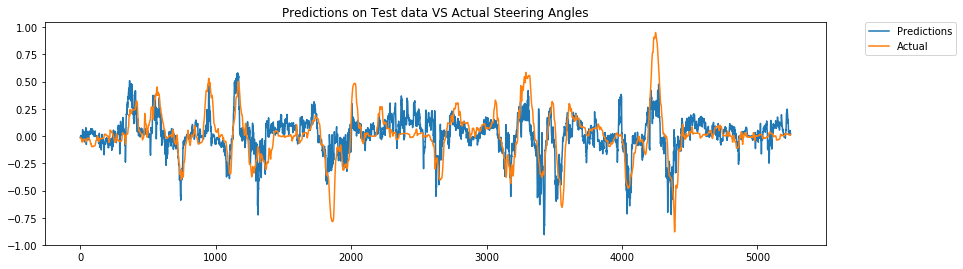

In [48]:
#Visualizing test predictions vs test labels
plt.subplot(211)
Predicted = plt.plot(final_predictions, label = 'Predictions')
Actual = plt.plot(y_test_5, label = 'Actual')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title("Predictions on Test data VS Actual Steering Angles")
plt.rcParams["figure.figsize"] = [14,9]
plt.savefig('test_predcitions_vs_labels')
plt.show()

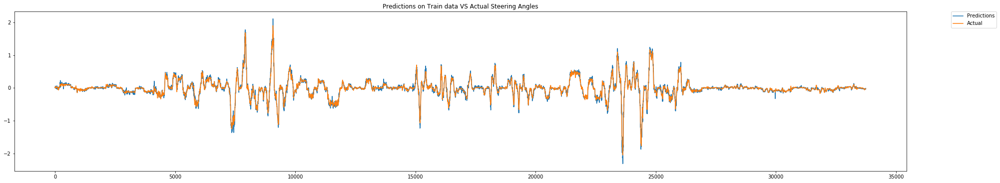

In [53]:
#Visualizing train predictions vs train labels
plt.subplot(311)
Predicted = plt.plot(train_predictions, label = 'Predictions')
Actual = plt.plot(y_train_5, label = 'Actual')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title("Predictions on Train data VS Actual Steering Angles")
plt.rcParams["figure.figsize"] = [32,24]
plt.savefig('train_predictions_vs_labels')
plt.show()

In [ ]:
#Visualizing steering angles on the images

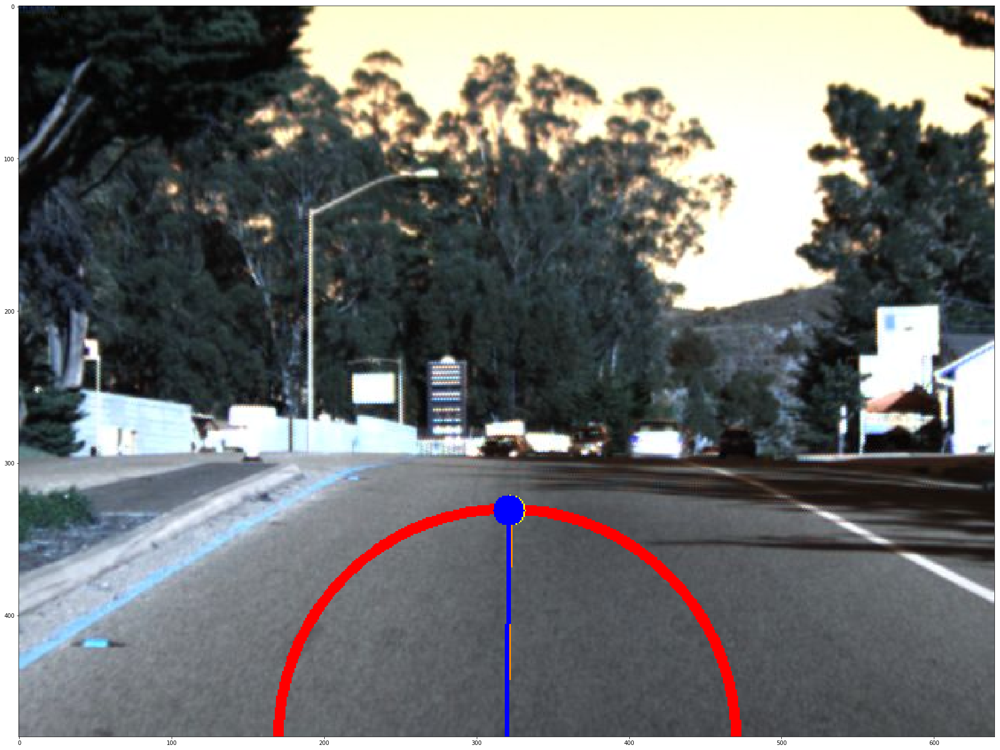

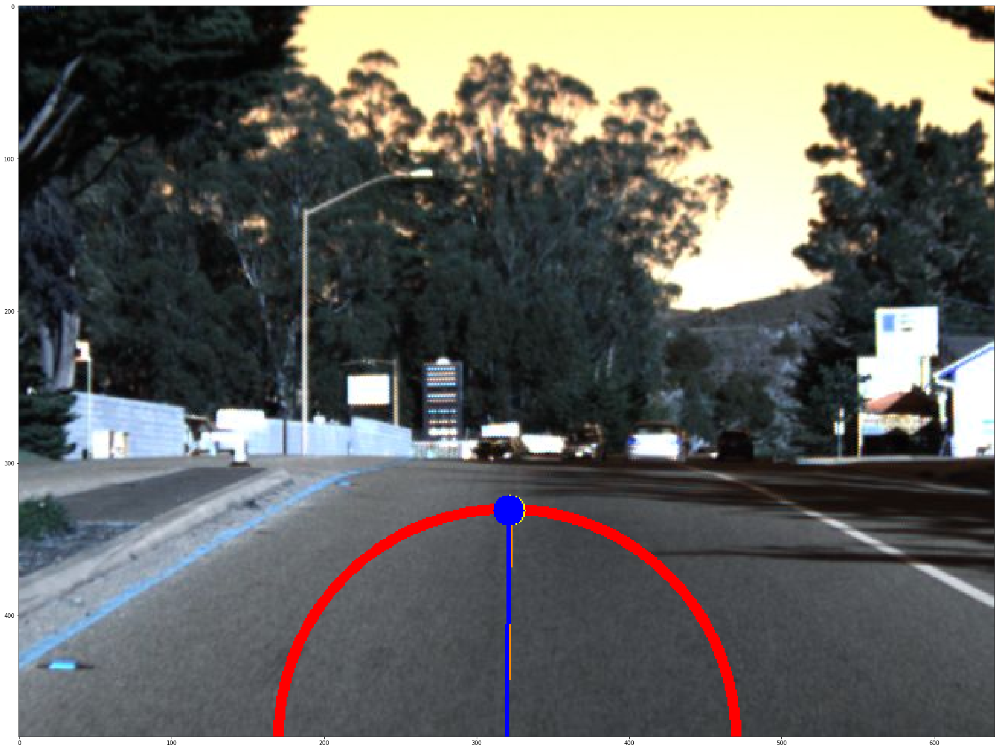

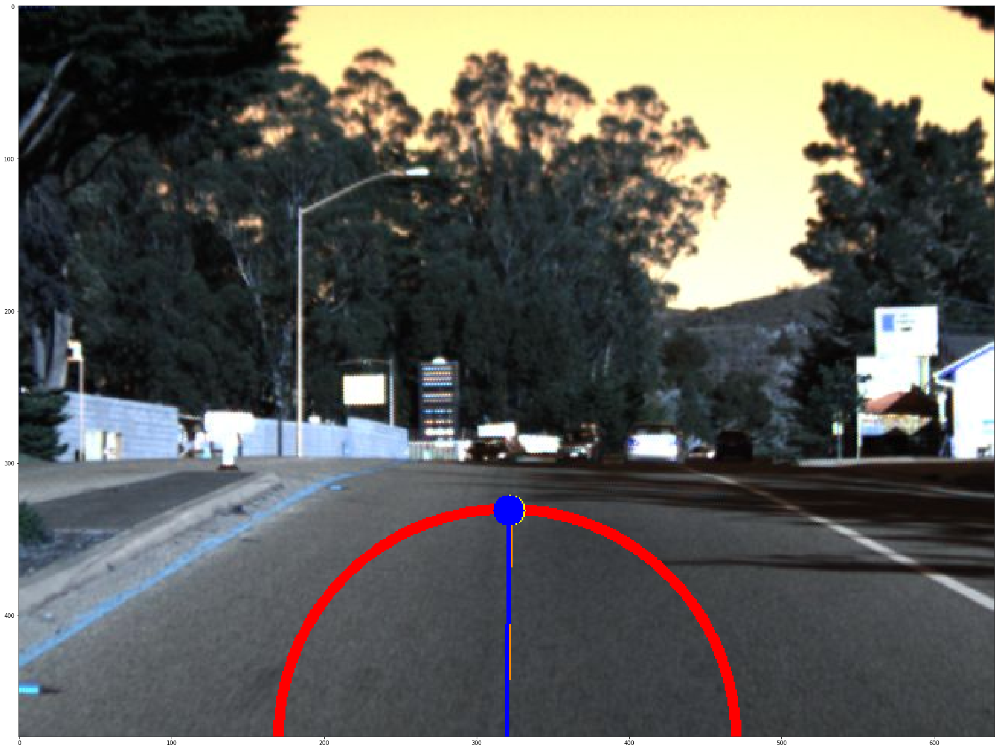

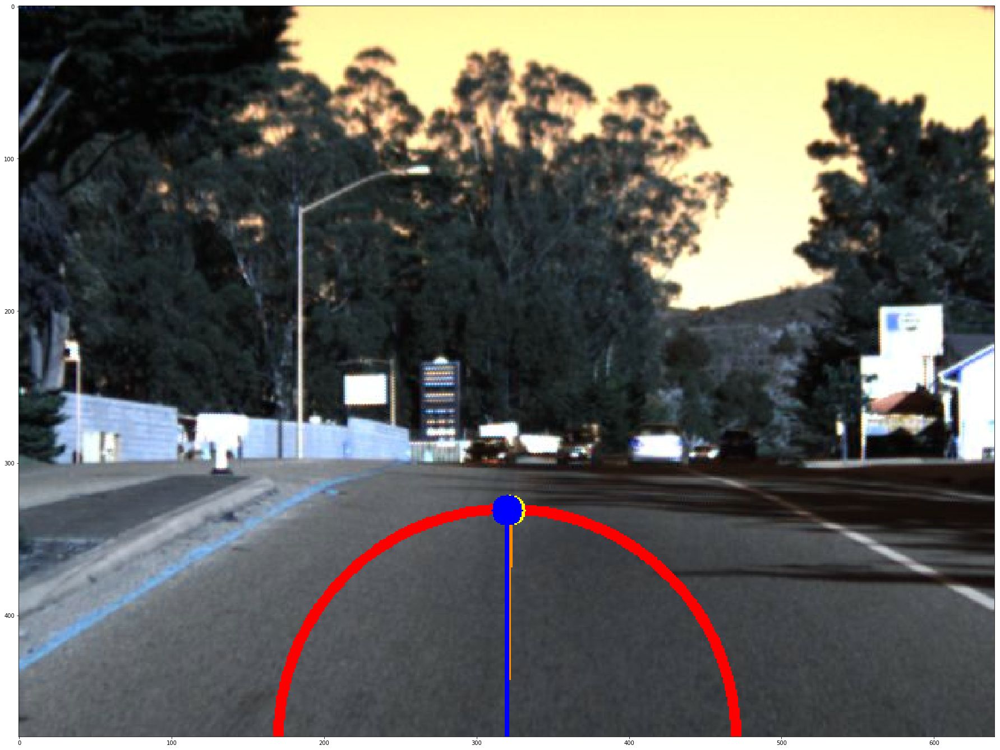

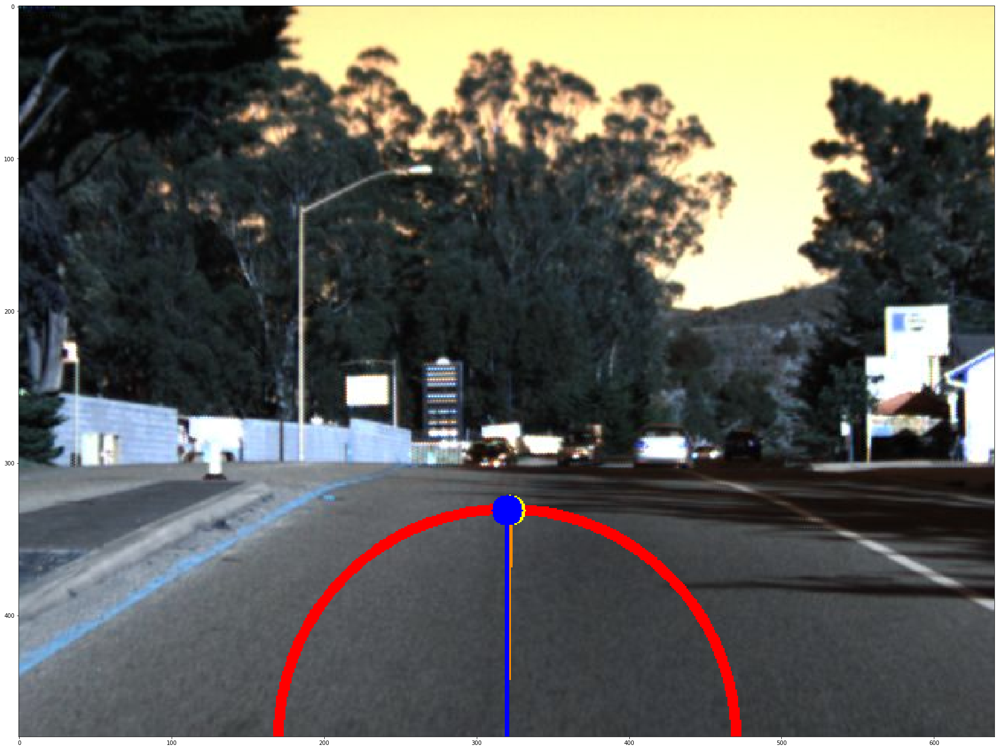

...

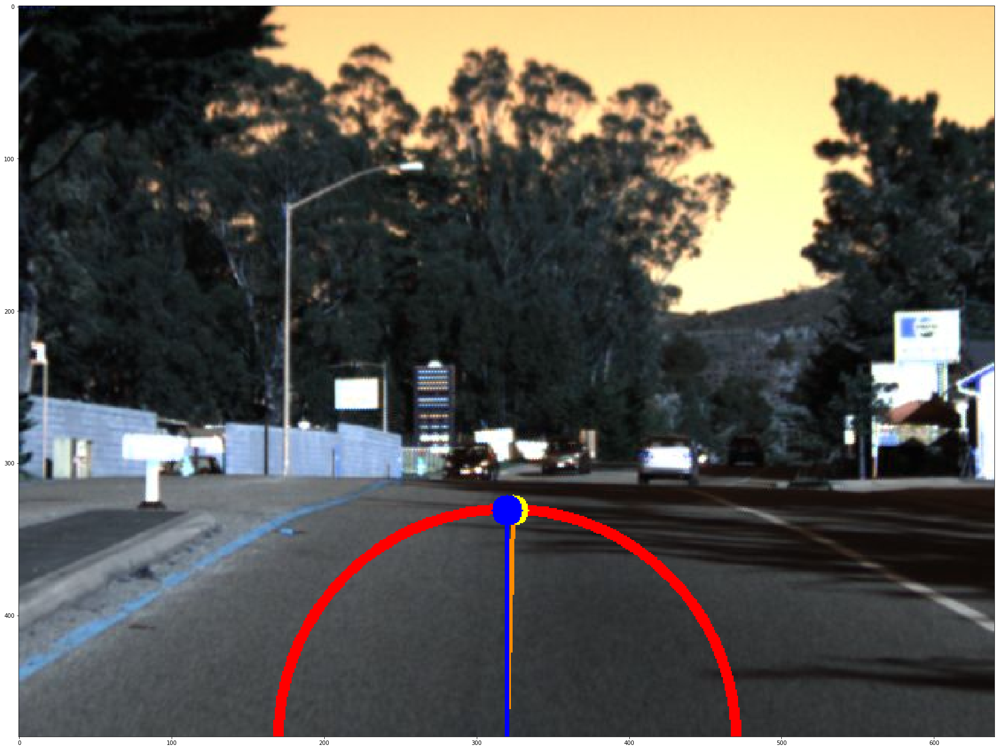

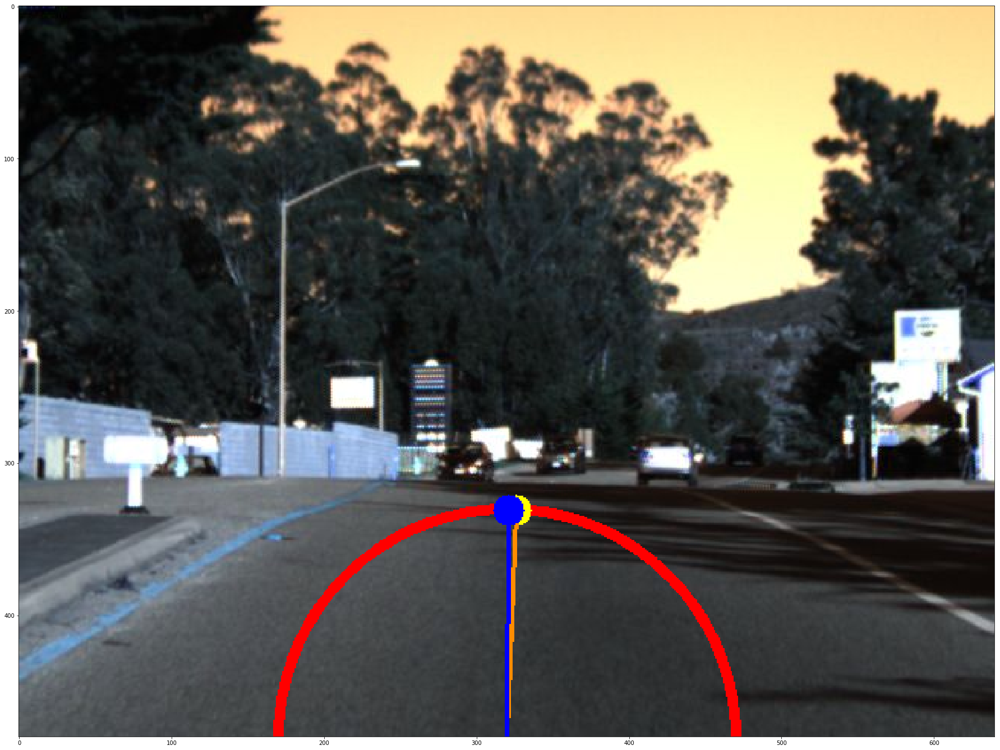

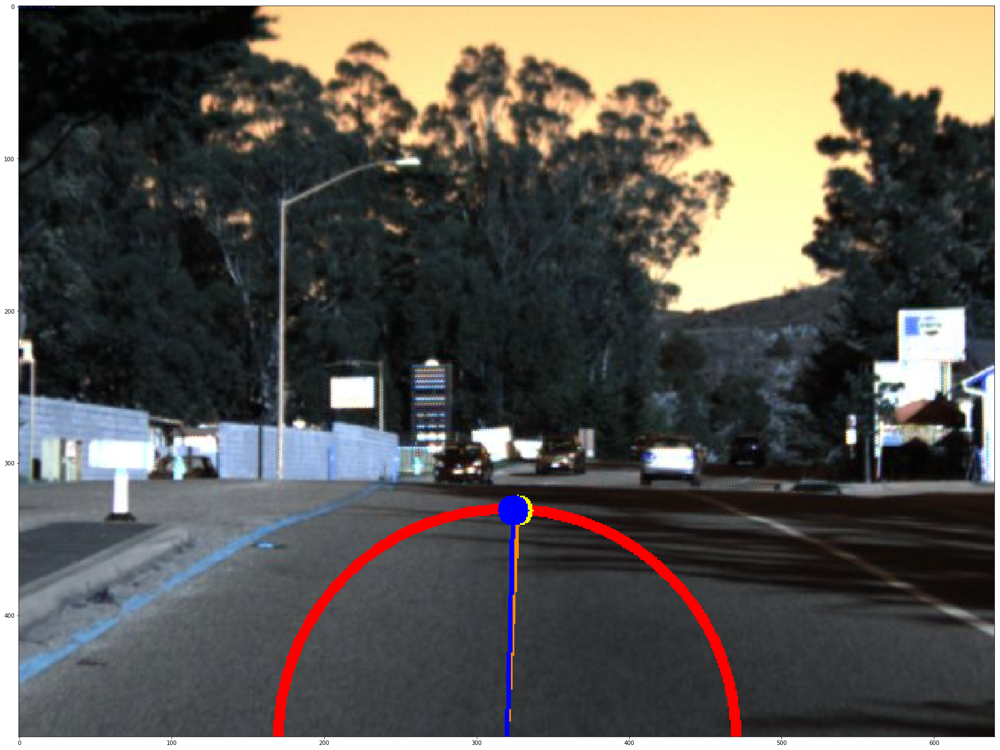

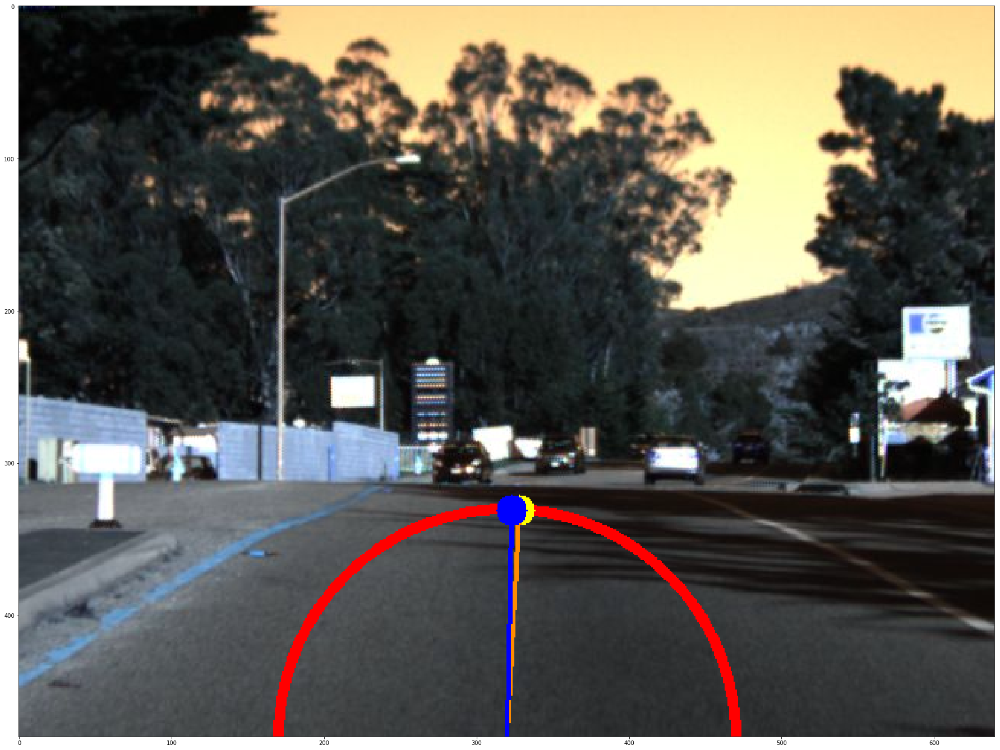

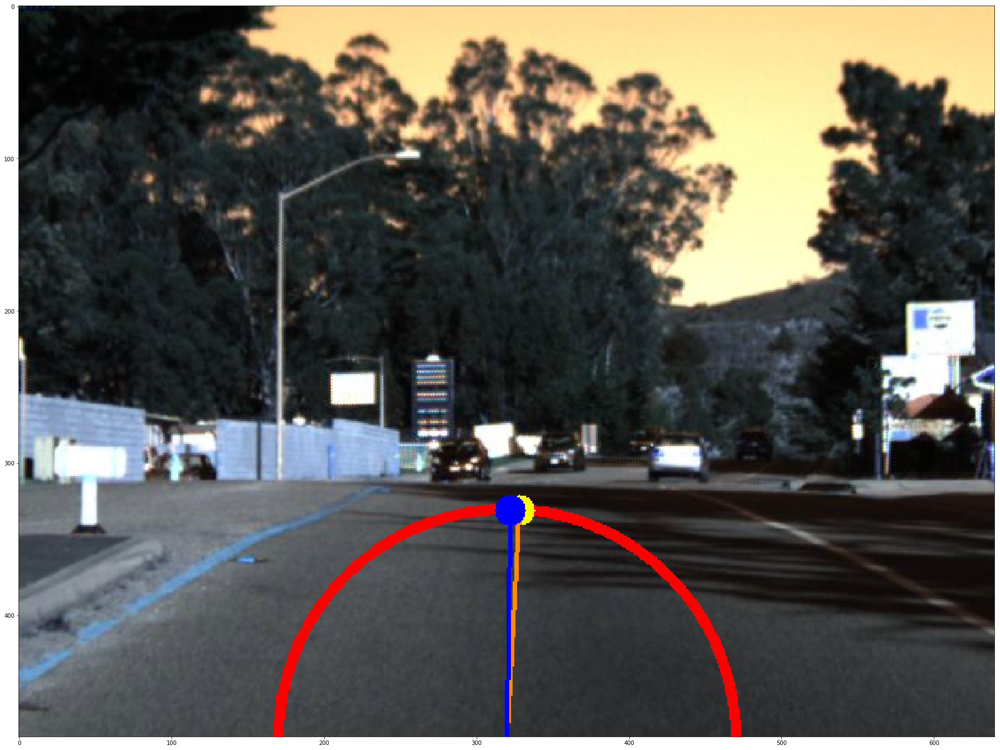

KeyboardInterrupt: 

In [58]:
#uncomment all the commented lines in the cell to create a video
#if you do not uncommente it only shows you the images.
import glob
import time
filenames = glob.glob('/home/ubuntu/testing/center/*.jpg')
filenames = sorted(filenames)
radius = 150
#fourcc = cv2.VideoWriter_fourcc(*'DIVX')
#test_video = cv2.VideoWriter('test_video.avi',fourcc,15,(640,480),1)
for i in range(len(filenames)-33):
    img = cv2.imread(filenames[i])
    angle = final_predictions[i] # radians
    true_angle = y_test_5[i] # radians
    #pred_txt = myfont.render("Prediction:" + str((angle* 57.2958, 3)), 1, (255,255,0)) # angle in degrees
    #true_txt = myfont.render("True angle:" + str((true_angle* 57.2958, 3)), 1, (255,255,0)) # angle in degrees
    
    cv2.circle(img,(320,480), radius, (255,0,0), 5)
    
    x = int(radius * np.cos(np.pi/2 + true_angle))
    y = int(radius * np.sin(np.pi/2 + true_angle))
    cv2.circle(img,(320+ int(x), 480-int(y)),10,(255,255,0),-5)
    cv2.line(img, (320+ int(x), 480-int(y)), (320,480),(255,140,0), thickness = 2, lineType = 8)
    
    x = radius * np.cos(np.pi/2 + angle)
    y = radius * np.sin(np.pi/2 + angle)
    cv2.circle(img,(320+ int(x), 480-int(y)),10,(0,0,255),-5)
    cv2.line(img,(320+ int(x), 480-int(y)),(320,480),(0,0,255), thickness =2, lineType = 8)
    
    #test_video.write(img)
    plt.imshow(img)
    plt.show()
    time.sleep(0.001)
    

#test_video.release()
#cv2.destroyAllWindows()